# PCA with AUSTEN

```yaml
Course:   DS 5001
Module:   07 Lab
Topic:    PCA
Author:   R.C. Alvarado
Date:     28 Februrary 2023 (revised)
```

**Purpose:**  Implement PCA with the works of Austen.

# Set Up

## Import

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [2]:
import plotly_express as px
import seaborn as sns

In [3]:
sns.set(style='ticks')

## Config

In [4]:
import configparser
config = configparser.ConfigParser()
config.read("../../../env.ini")
# data_home = config['DEFAULT']['data_home']
output_dir = config['DEFAULT']['output_dir']
# local_lib = config['DEFAULT']['local_lib']

In [5]:
data_prefix = 'austen-melville'

In [6]:
OHCO = ['book_id', 'chap_id']

In [7]:
colors = "YlGnBu" 

# Prepare the Data

## Import tables

In [8]:
VOCAB = pd.read_csv(f'{output_dir}/{data_prefix}-VOCAB2.csv').set_index('term_str')
LIB = pd.read_csv(f'{output_dir}/{data_prefix}-LIB_LABELS.csv').set_index('book_id')
TFIDF = pd.read_csv(f'{output_dir}/{data_prefix}-TFIDF_chap_L2.csv').set_index(['book_id', 'chap_id'])

## Generate analytical tables

In [9]:
class AUSTEN: pass

In [10]:
AUSTEN.LIB = LIB[LIB.author.str.match('AUSTEN')]
AUSTEN.TFIDF = TFIDF.loc[AUSTEN.LIB.index]

In [11]:
AUSTEN.TFIDF

sure     hands     short       new      word    passed  \
book_id chap_id                                                               
105     1       -0.012271  0.003859 -0.007822  0.016705  0.004818  0.004608   
        2       -0.012271  0.007178  0.024156 -0.009181  0.008190 -0.007954   
        3        0.014675  0.004502  0.005497 -0.009181  0.005471 -0.007954   
        4       -0.012271 -0.008847  0.041215 -0.009181  0.008554 -0.007954   
        5        0.026462  0.003946 -0.007822  0.016880  0.017906 -0.007954   
...                   ...       ...       ...       ...       ...       ...   
1342    57       0.005548 -0.008847  0.009793 -0.009181 -0.008095 -0.007954   
        58       0.002259 -0.008847  0.006541 -0.009181  0.021165  0.006278   
        59       0.047190  0.005882 -0.007822 -0.009181 -0.008095  0.050290   
        60       0.007553 -0.008847 -0.007822 -0.009181 -0.008095 -0.007954   
        61       0.031753 -0.008847 -0.007822 -0.009181 -0.008095 -0.007954   

                     fine      name     given     sight  ...    dreamy  \
book_id chap_id                                          ...             
105     1        0.004317  0.017191  0.044287 -0.007747  ... -0.001295   
        2       -0.008626 -0.008281  0.008758 -0.007747  ... -0.001295   
        3       -0.008626  0.085380  0.006026  0.005756  ... -0.001295   
        4        0.008062  0.008140  0.025849 -0.007747  ... -0.001295   
        5        0.004405 -0.008281  0.005458 -0.007747  ... -0.001295   
...                   ...       ...       ...       ...  ...       ...   
1342    57      -0.008626  0.044808  0.010422  0.010113  ... -0.001295   
        58      -0.008626  0.006148  0.051187 -0.007747  ... -0.001295   
        59       0.021379  0.006482  0.007435 -0.007747  ... -0.001295   
        60      -0.008626 -0.008281  0.012450  0.012122  ... -0.001295   
        61      -0.008626 -0.008281  0.014664 -0.007747  ... -0.001295   

                     lash  delayed  outrageous  congregation      haul  \
book_id chap_id                                                          
105     1       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        2       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        3       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        4       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        5       -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
...                   ...      ...         ...           ...       ...   
1342    57      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        58      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        59      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        60      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   
        61      -0.001565 -0.00101   -0.001003     -0.001498 -0.001491   

                 promoted    offend     irons  uncertainty  
book_id chap_id                                             
105     1        0.046909 -0.000955 -0.001315    -0.000986  
        2       -0.001148 -0.000955 -0.001315    -0.000986  
        3       -0.001148 -0.000955 -0.001315    -0.000986  
        4       -0.001148 -0.000955 -0.001315    -0.000986  
        5       -0.001148  0.046889 -0.001315    -0.000986  
...                   ...       ...       ...          ...  
1342    57      -0.001148 -0.000955 -0.001315    -0.000986  
        58      -0.001148 -0.000955 -0.001315    -0.000986  
        59      -0.001148 -0.000955 -0.001315    -0.000986  
        60      -0.001148 -0.000955 -0.001315    -0.000986  
        61      -0.001148 -0.000955 -0.001315    -0.000986  

[334 rows x 5000 columns]

# PCA

In [12]:
n_comps = 5
pc_cols = [f"PC{i}" for i in range(n_comps)]
pca_engine = PCA(n_components=n_comps)

In [13]:
# X = AUSTEN.TFIDF

In [14]:
DCM = pd.DataFrame(pca_engine.fit_transform(AUSTEN.TFIDF.fillna(0)), index=AUSTEN.TFIDF.index)
DCM.columns = pc_cols # ['PC{}'.format(i) for i in DCM.columns]
DCM = DCM.join(AUSTEN.LIB, on='book_id')
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [15]:
LOADINGS = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS.columns = ["PC{}".format(i) for i in LOADINGS.columns]
LOADINGS.index = AUSTEN.TFIDF.columns
LOADINGS.index.name = 'term_str'
LOADINGS = LOADINGS.join(VOCAB)

# Visualize

In [16]:
def vis_pcs(a=0, b=1, label='title', hover_name='doc', symbol=None, size=None):
    return px.scatter(DCM, f"PC{a}", f"PC{b}", 
                    color=label, hover_name=hover_name, 
                     symbol=symbol, size=size,
                     marginal_x='box', height=800)

In [17]:
def vis_loadings(a=0, b=1, hover_name='term_str'):
    return px.scatter(LOADINGS.reset_index(), f"PC{a}", f"PC{b}", 
                      text='term_str', hover_name='term_str',
                      size='dfidf', color='max_pos_group', 
                      marginal_x='box', height=800)

## PC 0 and 1

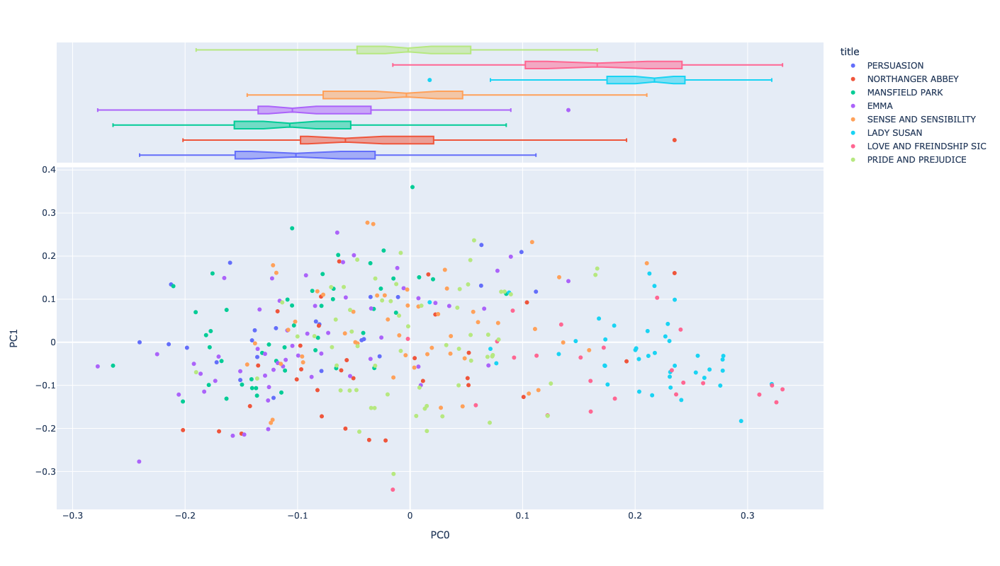

In [18]:
vis_pcs(0, 1)

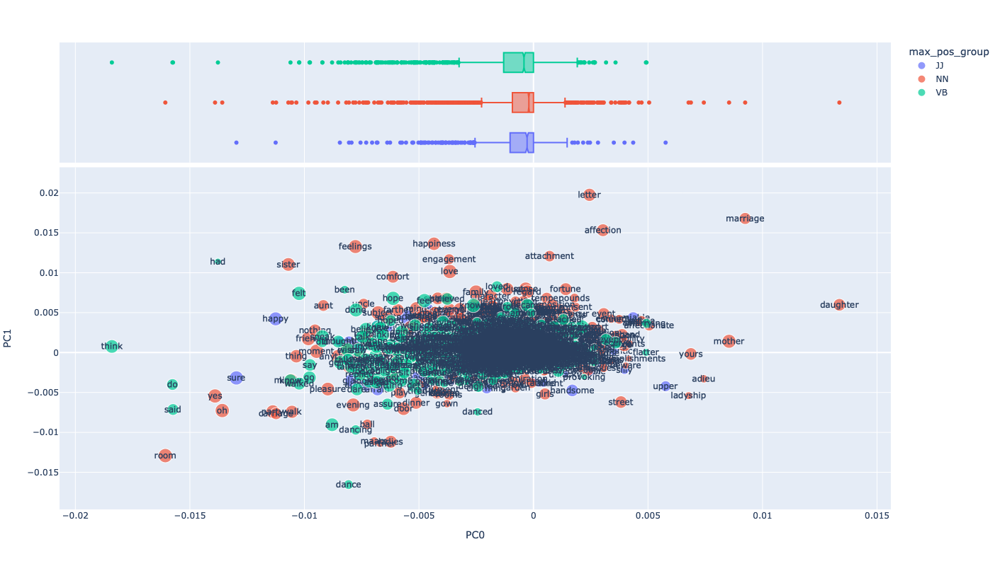

In [19]:
vis_loadings(0, 1)

## PC 1 and 2

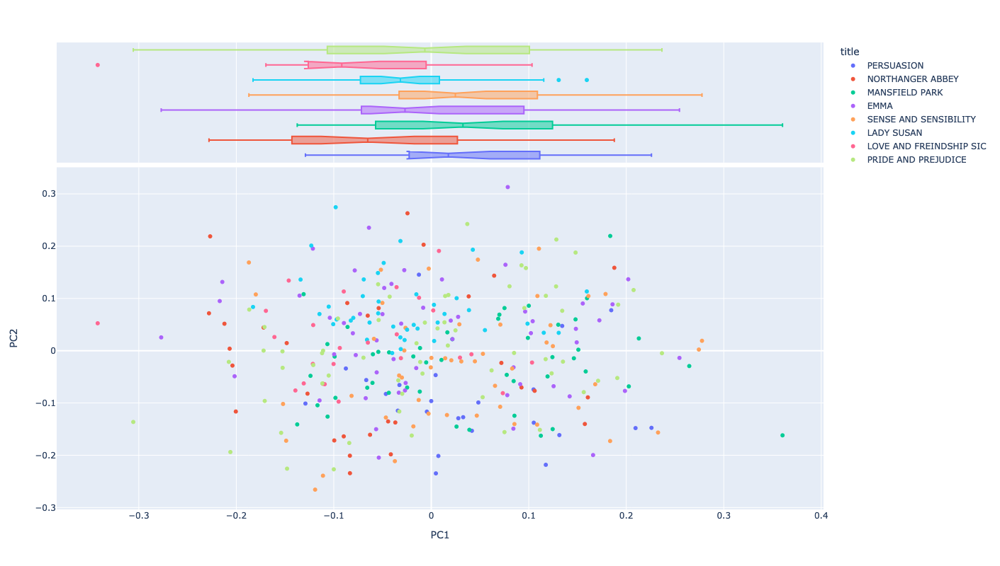

In [20]:
vis_pcs(1, 2)

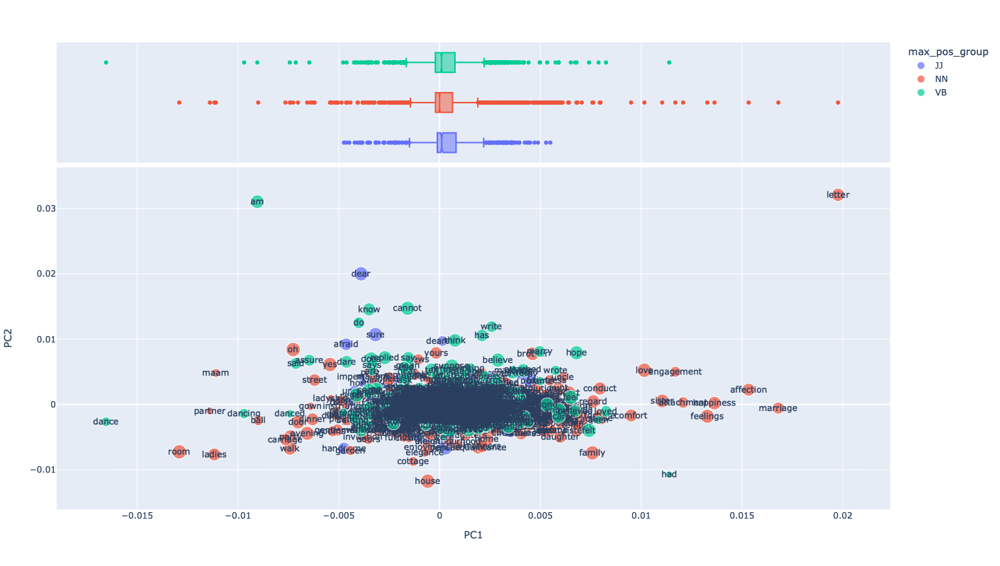

In [21]:
vis_loadings(1, 2)

##  PC 2 and 3

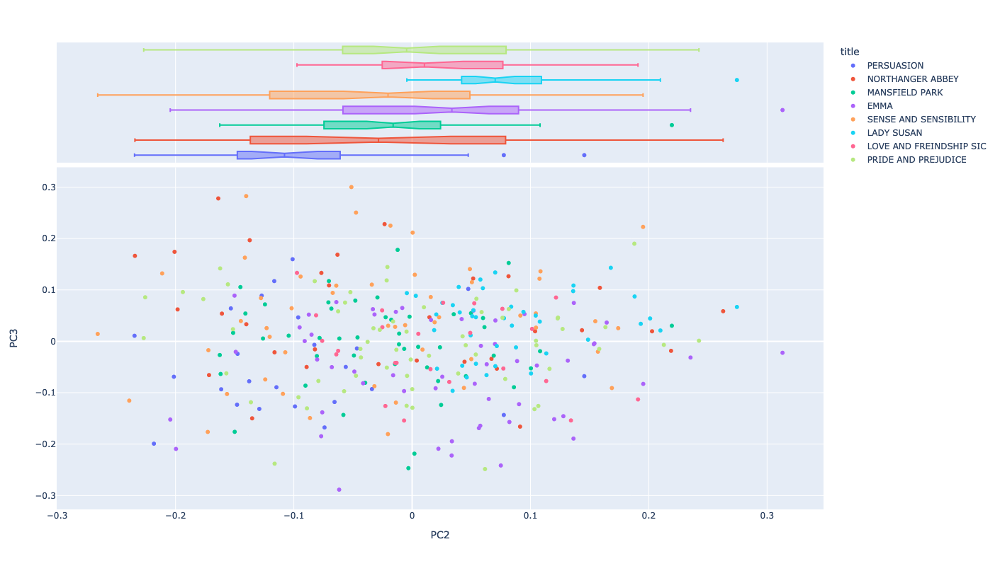

In [22]:
vis_pcs(2, 3)

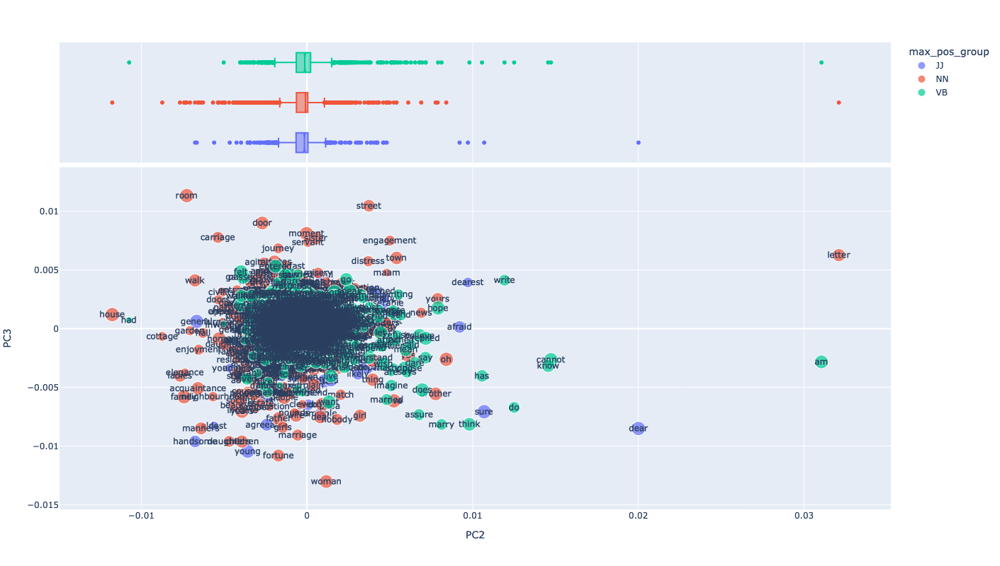

In [23]:
vis_loadings(2, 3)

## Interpet Loadings

In [24]:
top_terms_sk= {}

data = []
for i in range(n_comps):
    for j in [0, 1]:
        data.append((i, j, ' '.join(LOADINGS.sort_values(f'PC{i}', ascending=bool(j)).head(10).index.to_list())))

comp_strs = pd.DataFrame(data)
comp_strs.columns =  ['pc', 'pole', 'gloss']
comp_strs = comp_strs.set_index(['pc', 'pole'])

In [25]:
comp_strs.unstack()

gloss  \
pole                                                  0   
pc                                                        
0     daughter marriage mother adieu yours ladyship ...   
1     letter marriage affection happiness feelings a...   
2     letter am dear cannot know do write sure has t...   
3     room street door moment carriage sister engage...   
4     mother sister sisters married dear daughters p...   

                                                         
pole                                                  1  
pc                                                       
0        think room do said yes had oh sure party happy  
1     dance room partner ladies maam dancing am ball...  
2     house had cottage ladies family elegance room ...  
3     woman fortune young children handsome daughter...  
4     feelings ball dearest friendship upper friend ...

# Cluster Loadings

In [26]:
from sklearn.cluster import KMeans
from string import ascii_uppercase as ltrs

In [27]:
k = n_comps * 2
LOADINGS['cat'] = [ltrs[i] for i in KMeans(k, n_init='auto').fit_predict(LOADINGS[pc_cols])]
LOADINGS['maxpc'] = LOADINGS[pc_cols].idxmax(1)
LOADINGS['minpc'] = LOADINGS[pc_cols].idxmin(1)

In [28]:
LOADINGS.groupby('maxpc').apply(lambda x: ' '.join(x.index))

maxpc
PC0    dark wife form story age beauty heads various ...
PC1    short name given friend knew manner ill known ...
PC2    sure word true find does told hope get hear cr...
PC3    passed sight high rest turned open looking gen...
PC4    hands new fine people face therefore coming ki...
dtype: object

In [29]:
LOADINGS.groupby('minpc').apply(lambda x: ' '.join(x.index))

minpc
PC0    sure hands short word passed fine name sight p...
PC1    keep stand am door black following cold ye tow...
PC2    new general gave water large small house famil...
PC3    therefore love years dear person means young f...
PC4    given doubt feelings common dark mine degree v...
dtype: object

In [30]:
def vizpc(a, b):
    return px.scatter(LOADINGS.reset_index(), f'PC{a}', f'PC{b}', 
                      color='cat', size='dfidf',
                      hover_name='term_str', 
                      marginal_x='box', height=800, width=900)

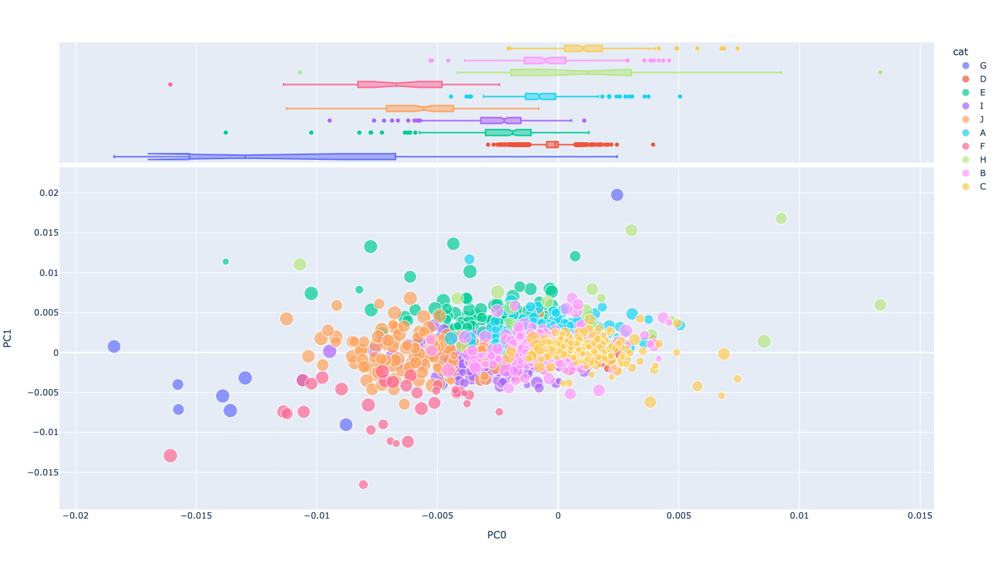

In [31]:
vizpc(0, 1)

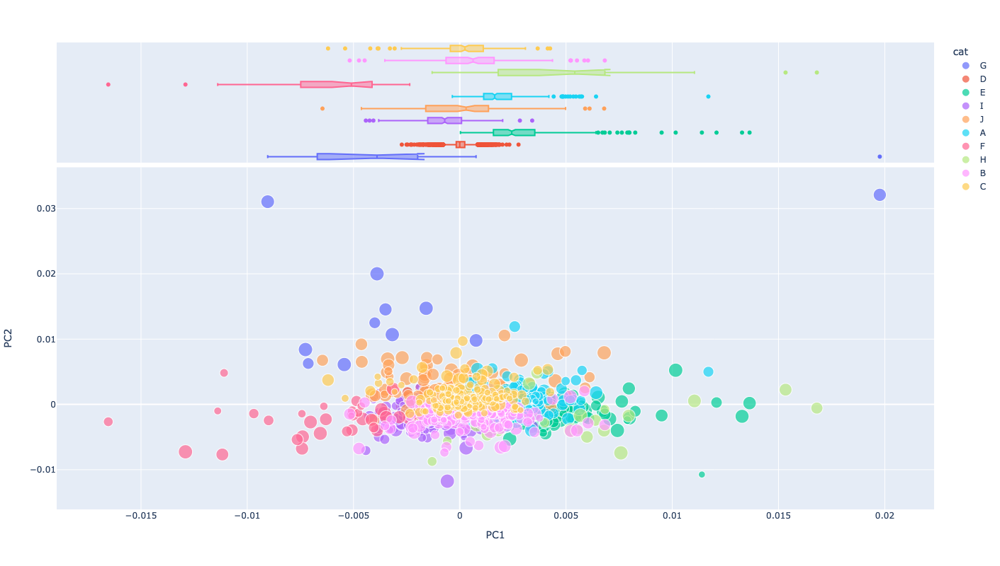

In [32]:
vizpc(1, 2)

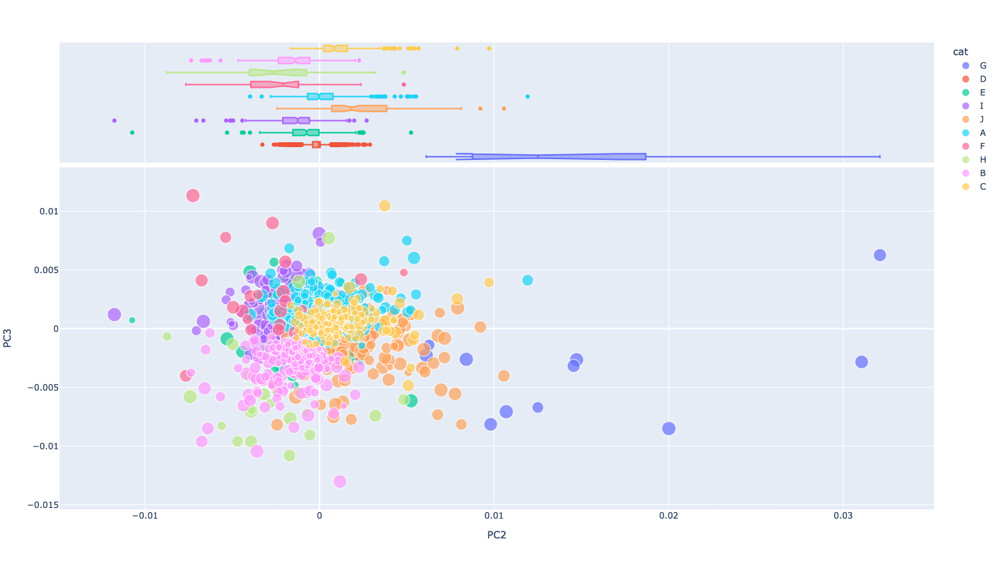

In [33]:
vizpc(2, 3)

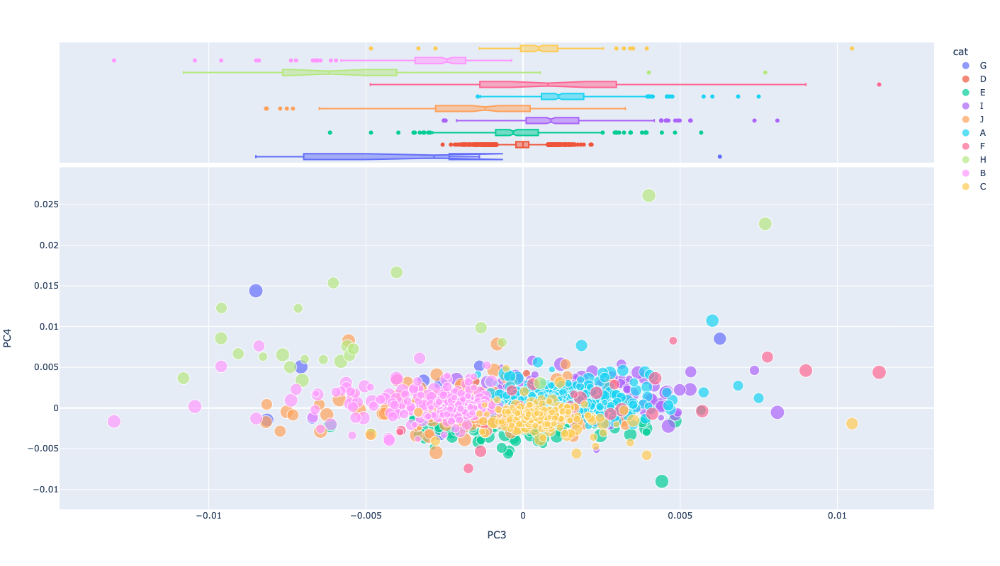

In [34]:
vizpc(3, 4)

# Categories

In [35]:
CATS = LOADINGS.groupby('cat').n.sum().to_frame('n')
CATS['p'] = CATS.n / CATS.n.sum()
CATS['i'] = np.log2(1/CATS.p)
CATS['h'] = CATS.p * CATS.i
CATS['dfidf_mean'] = LOADINGS.groupby('cat').dfidf.mean()
CATS['gloss'] = LOADINGS.groupby('cat').apply(lambda x: ' '.join(x.sort_values('dfidf', ascending=False).head(10).index))
CATS['maxpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmax(1)
CATS['minpc'] = LOADINGS.groupby('cat')[pc_cols].mean().idxmin(1)

In [36]:
CATS.sort_values('dfidf_mean', ascending=False)

,n,p,i,h,dfidf_mean,gloss,maxpc,minpc
cat,,,,,,,,
G,21864,0.030776,5.022049,0.154559,536.467848,sure yes oh dear cannot am think letter know said,PC2,PC0
J,97745,0.137587,2.861583,0.393717,477.974707,word people friend knew true does coming kind ...,PC2,PC0
H,8623,0.012138,6.364345,0.077249,446.096513,years family mother father sister year girl ch...,PC4,PC3
F,12330,0.017356,5.848434,0.101505,410.361659,looking room looked evening pleasure party doo...,PC3,PC0
I,122682,0.172689,2.533755,0.437551,372.028633,new passed fine sight rest face find turned op...,PC3,PC0
E,97972,0.137907,2.858237,0.394170,363.243594,short given manner ill known felt making point...,PC1,PC0
B,40287,0.056708,4.140292,0.234790,318.105000,large person means company young death live wo...,PC1,PC3
A,49651,0.069889,3.838784,0.268290,296.008036,name therefore certain strange reason days lig...,PC1,PC0
C,15618,0.021984,5.507397,0.121075,238.820562,mine impossible form story act greatest creatu...,PC0,PC4


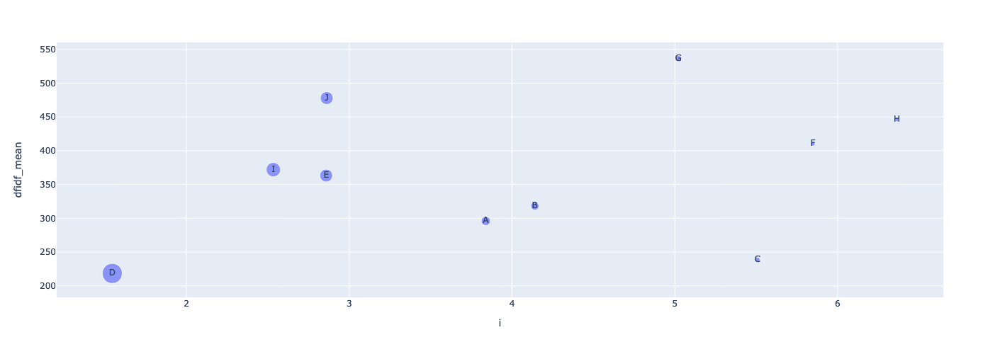

In [41]:
px.scatter(CATS.reset_index(), 'i', 'dfidf_mean', 
           hover_name='gloss',
           text='cat', size='n', height=500, width=600)

In [38]:
CATS

,n,p,i,h,dfidf_mean,gloss,maxpc,minpc
cat,,,,,,,,
A,49651,0.069889,3.838784,0.268290,296.008036,name therefore certain strange reason days lig...,PC1,PC0
B,40287,0.056708,4.140292,0.234790,318.105000,large person means company young death live wo...,PC1,PC3
C,15618,0.021984,5.507397,0.121075,238.820562,mine impossible form story act greatest creatu...,PC0,PC4
D,243651,0.342966,1.543862,0.529492,218.353392,hands high times white water small hard sea ke...,PC1,PC0
E,97972,0.137907,2.858237,0.394170,363.243594,short given manner ill known felt making point...,PC1,PC0
F,12330,0.017356,5.848434,0.101505,410.361659,looking room looked evening pleasure party doo...,PC3,PC0
G,21864,0.030776,5.022049,0.154559,536.467848,sure yes oh dear cannot am think letter know said,PC2,PC0
H,8623,0.012138,6.364345,0.077249,446.096513,years family mother father sister year girl ch...,PC4,PC3
I,122682,0.172689,2.533755,0.437551,372.028633,new passed fine sight rest face find turned op...,PC3,PC0
